# 15-388 Final Project
author: Sarah Lee, Lynn Gu

## Outline
For our project final report, we organize it into 6 parts:

1. **Introduction**
2. **Data Collection**: collect data with `PUBG` API and `PUBG-python` package along with `Chicken-Dinner` pacakge.
3. **Data Preprocessing**: remove "leaking" variables and add self defined features into our dataframe.
4. **Exploratory Data Analysis** we plotted basic histograms and also conditional histogram to better understand our data.
5. **Logistic Regression and Random Forest**: select best features with random forest model and then built a logistic regression model to perform binary classification.
6. **Conclusions**

For train-test data split, logistic regression models and random forest classifiers we used `scikit-learn` module in python.
(http://scikit-learn.org/stable/modules/classes.html). 

## 1. Introduction

__1). Motivation__

As PUBG players ourselves, we want to examine what would affect a player's performance in each match. So that we can determine the winning strategy of PUBG games: does weapon choice matter, should we walk more or stay and hide until each match ends, where do most people get killed, etc.

__2). Research Questions__

To formalize, we have 2 research questions in this project:

1. What weapon should we use in PUBG games, condition on the distance?

2. What factors decides you win or not in PUBG games? Base on the observations, what stragegy should we use? Run and kill or hide and wait?

__3). Project Overview__

We first used `PUBG` API and `PUBG-python` package along with `Chicken-Dinner` pacakge to gather data. Then perform data preprocessing and visualize some EDAs for better understanding of our data. Finally we perform regression models and use random forest to better select our features for regression.

## 2. Data Collection

__1). Library Import__

In [425]:
import progressbar
import pandas as pd 

For the data collection, we first import the package `chicken_dinner.pubgiapi`

In [426]:
from chicken_dinner.pubgapi import PUBG

The first step to get access to the data, we have to get the API key from the `PUBG` official website. 

We don't provided our API key here, for security concerns in github.

With the API key that you have received, you can call the `PUBG` function with the region you are interested in. 
Here, we are interested in the `North America` PUBG plays, so we will use `pc-na` as a parameter to get access to the North American PUBG matches.

In [427]:
#PUBG api key
api_key = "xxx"

Then, we can get access to the sample matches from using the `pubg` defined up there as the command below. As shown, the samples is a built-in class of `pubg`. There are many more basic play-arounds we did with packages, we will include them in our github post.(https://github.com/lynngu9829/15388-final-project-pubg)

__2). Get Player Information__

In [430]:
def getPlayerInfo(sample_matches):
    bar = progressbar.ProgressBar()
    game_mode = []
    map_name = []
    dbnos = []
    assists = []
    boosts = []
    damage_dealt = []
    death_type = []
    headshot_kills = []
    heals = []
    kill_place = []
    kill_streaks = []
    kills = []
    longest_kill = []
    player_id = []
    revives = []
    ride_distance = []
    road_kills = []
    swim_distance = []
    team_kills = []
    time_survived = []
    vehicle_destroys = []
    walk_distance = []
    weapons_acquired = []
    win_place = []

    for m in bar(sample_matches):
        match = pubg.match(m)
        participants = match.participants
        for p in participants:
            map_name.append(match.map_name)
            game_mode.append(match.game_mode)
            stats = p.stats
            dbnos.append(stats['dbnos'])
            assists.append(stats['assists'])
            boosts.append(stats['boosts'])
            damage_dealt.append(stats['damage_dealt'])
            death_type.append(stats['death_type'])
            headshot_kills.append(stats['headshot_kills'])
            heals.append(stats['heals'])
            kill_place.append(stats['kill_place'])
            kill_streaks.append(stats['kill_streaks'])
            kills.append(stats['kills'])
            longest_kill.append(stats['longest_kill'])
            player_id.append(stats['player_id'])
            revives.append(stats['revives'])
            ride_distance.append(stats['ride_distance'])
            road_kills.append(stats['road_kills'])
            swim_distance.append(stats['swim_distance'])
            team_kills.append(stats['team_kills'])
            time_survived.append(stats['time_survived'])
            vehicle_destroys.append(stats['vehicle_destroys'])
            walk_distance.append(stats['walk_distance'])
            weapons_acquired.append(stats['weapons_acquired'])
            win_place.append(stats['win_place'])
        data = {'map_name': map_name, 'game_mode':game_mode,'dbnos': dbnos,'assists': assists,'boosts': boosts,
                'damage_dealt': damage_dealt,'death_type': death_type,'headshot_kills': headshot_kills,
                'heals': heals,'kill_place': kill_place,'kill_streaks': kill_streaks,'kills': kills,
                'longest_kill': longest_kill,'player_id': player_id,'revives': revives,'ride_distance': ride_distance,
                'road_kills': road_kills,'swim_distance': swim_distance,'team_kills': team_kills,'time_survived': time_survived,
                'vehicle_destroys': vehicle_destroys,'walk_distance': walk_distance,'weapons_acquired': weapons_acquired,
                'win_place': win_place}
        df = pd.DataFrame(data)
        return df

For the consistency of the project, we will comment out the command line below that will give you the data for player info.

In [431]:
# df = getPlayerInfo(sample_matches)
# df.to_csv("player_info.csv", index = False)

__3). Get Kill Events Information__

We have collected the `logKillEvent` data from the `telemetry` events. By getting access to the telemetry events and objects using the PUBG API, we were able to have access to each `logKillEvent`. Each `logKillEvent` provides the information of the killer and victim's information. 

After we have received the `logKillEvent`, we have created a pandas dataframe and saved it into a csv file. 

We have used the function `getKillEventData` function below to store the data. 

(The whole procedure takes around 1.5 hours to process)

In [432]:
def getKillEventData(sample_matches):
    bar = progressbar.ProgressBar()
    gameMode = []
    mapName = []
    killer_health = []
    killer_location_x = []
    killer_location_y = []
    killer_location_z = []
    damage_reason = []
    damage_causer = []
    damage_category = []
    damage_additional_info = []
    killer_in_blue_zone = []
    victim_health = []
    victim_location_x = []
    victim_location_y = []
    victim_location_z = []
    victim_in_blue_zone = []
    for m in bar(range(len(sample_matches))):
        curr_match = sample_matches[m]
        match = pubg.match(curr_match)
        game_mode = match.game_mode
        map_name = match.map_name
        telemetry = match.get_telemetry()
        kill_events = telemetry.filter_by("log_player_kill")
        for kill in kill_events:
            gameMode.append(game_mode)
            mapName.append(map_name)
            damage_reason.append(kill.damage_reason)
            weapon = kill.damage_causer_name
            if weapon not in weaponId:
                damage_causer.append(weapon)
            else:
                damage_causer.append(weaponId[weapon])
            damage_category.append(kill.damage_type_category)
            damage_add_inf = kill.damage_causer_additional_info
            if len(damage_add_inf) == 0:
                damage_additional_info.append(None)
            else:
                damage_additional_info.append(itemId[damage_add_inf[0]])
            killer = kill.killer
            if killer != None:
                killer_health.append(killer.health)
                killer_location_x.append(killer.location.x)
                killer_location_y.append(killer.location.y)
                killer_location_z.append(killer.location.z)
                killer_in_blue_zone.append(killer.is_in_blue_zone)
            else:
                killer_health.append(None)
                killer_location_x.append(None)
                killer_location_y.append(None)
                killer_location_z.append(None)
                killer_in_blue_zone.append(None)
            victim = kill.victim
            victim_health.append(victim.health)
            victim_location_x.append(victim.location.x)
            victim_location_y.append(victim.location.y)
            victim_location_z.append(victim.location.z)
            victim_in_blue_zone.append(victim.is_in_blue_zone)
        data = {'Game_Mode':gameMode, 'Map_Name': mapName, 'killer_health':killer_health, 'killer_location_x':killer_location_x,
       'killer_location_y': killer_location_y, 'killer_location_z':killer_location_z,'damage_reason':damage_reason,
       'damage_category': damage_category, 'damage_additional_info':damage_additional_info, 
        'killer_in_blue_zone':killer_in_blue_zone, 'damage_causer':damage_causer,
       'victim_health':victim_health, 'victim_location_x':victim_location_x, 'victim_location_y':victim_location_y,
       'victim_location_z':victim_location_z, 'victim_in_blue_zone': victim_in_blue_zone} 
        df = pd.DataFrame(data)
        return df

Only run the code below when you want to get the data. It will approximately take 1.5 hours to process.

In [433]:
# df = getKillEventData(sample_matches)
# df.to_csv("killer_info.csv", index = False)

## 3. Data Preprocessing

__1). Import Data__

We run our data scarping function `getPlayerInfo()` twice and generated 2 csv files, named:

- "player_info.csv"
- "player_info2.csv".

We import them as `pandas dataframe` and concat them. The concatenated dataframe have 103394 rows and 24 columns.

In [434]:
import pandas as pd
import numpy as np
df1 = pd.read_csv("player_info.csv")
df2 = pd.read_csv("player_info2.csv")
data = pd.concat([df1, df2])
print(data.shape)

(103394, 24)


Then we added a `win_or_not` column for future logistic regressions. We also use `walk_distance` and `time_survived` to generate `avg_walk_distance` as it makes more sense to see how far each player walked over their total survived time.

In [435]:
## create new column, we want to predict a player wins or not in 
data['win_or_not'] = np.where(data['win_place'] == 1, 1, 0)
# create self defined variables
data["avg_walk_distance"] = np.divide(data["walk_distance"], data["time_survived"])

We remove `player_id` from our data as it doesn't have much meaning. We also removed `death_type` as it's a "leaking" variable, which can possibly infer whether the player will win or not.

In [436]:
# drop leaking variables
data = data.drop(columns = ['player_id', "death_type","walk_distance", "time_survived"], axis = 1)

__2). Overview of Data Set__

Now, we take a closer look at our imported raw dataset. Here's a table of columns and what they mean:

| Column | Sample | Does/is the respondent... | Type/Values |
| --- |:--- |:--- |:--- |
| **map_name** | 'Miramar' | which map player is using? | (`Miramar`, `Sanhok`, `Vikendi`, `Erangel (Remastered)`, `Camp Jackal`) -- corresponding to 5 maps in PUBG |
| **game_mode** | 'squad' | what game mode player chose? | (`squad`, `squad-fpp`, `duo`, `duo-fpp`, `solo`, `solo-fpp`) `squad` means 4 players per roster, `duo` means 2 person per roster, `solo` means 1 player per roster, `-fpp` suffix means player chose first person perspective view |
| **dbnos**    | '4'   | number of times player is "down but not out": player's `hp = 0` but was revived by teammate later | integer     |
| **assists** | '2' | number of assists | integer |
| **boosts** | '3' | number of boosts | integer |
| **damage_dealt** | 524.65390 | damage dealt | float |
| **death_type** | 'byplayer' | how they died | (`byplayer`, `suicide`, `byzone`, `alive`, `logout`) |
| **headshot_kills** | '2' | number of headshots made| integer |
| **heals** | '1' | number of heals | boolean |
| **kill_place** | '50' | kill rank of player in the match | integers |
| **kill_streaks** | '2' | players you kill | integer |
| **kills** | '4' | number of kills | integer |
| **longest_kill** | '232.49112' | distance of longest kill made in match | float |
| **player_id** | 'account.76d8d8f0a92f40869951622bba98cfd9' | player id | string _(ignore in regression)_ |
| **revives** | '2' | number of revives used | integer |
| **ride_distance** | 121.341 | distance traveled in vehicle | float |
| **road_kills** | '3' | number of road kills made | integer |
| **swim_distance** | 24.351 | distance swimed | float |
| **team_kills** | '6' | total number of kills made by team | integer |
| **time_survived** | '1690.111' | number of seconds player is alive | float |
| **vehicle_destroys** | '3' | number of vehicles player destroyed | integer |
| **walk_distance** | '145.321' | total distance player walked | float |
| **weapons_acquired** | '4' | number of weapons player acquired | integer |
| **win_place** | '7' | ranking of roster player is in | integer |
| **win_or_not** | '1' | (`1`, `0`) indicates whether `win_place` is one or not | integer |

__3). One-hot Encoding of Categorical Variables__

In order to build regression models on our features, we perform one-hot encoding on `map_name` and `game_mode`. As they are categorical variables in our dataset.

In [437]:
## One-hot encoding
data = pd.get_dummies(data = data, columns = ["map_name"], prefix = "map_name")
data = pd.get_dummies(data = data, columns = ["game_mode"], prefix = "game_mode")

# data.to_csv("One-hot.csv", index = False)
display(data)

,dbnos,assists,boosts,damage_dealt,headshot_kills,heals,kill_place,kill_streaks,kills,longest_kill,...,map_name_Erangel (Remastered),map_name_Miramar,map_name_Sanhok,map_name_Vikendi,game_mode_duo,game_mode_duo-fpp,game_mode_solo,game_mode_solo-fpp,game_mode_squad,game_mode_squad-fpp
0,0,0,0,0.000000,0,0,70,0,0,0.000000,...,0,1,0,0,0,0,0,0,1,0
1,0,0,0,0.000000,0,0,69,0,0,0.000000,...,0,1,0,0,0,0,0,0,1,0
2,3,0,4,524.653900,2,4,3,1,5,232.491120,...,0,1,0,0,0,0,0,0,1,0
3,4,0,6,494.225280,2,3,4,2,5,26.957731,...,0,1,0,0,0,0,0,0,1,0
4,2,2,10,216.196750,0,5,18,1,1,19.875786,...,0,1,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51692,0,0,0,0.000000,0,0,73,0,0,0.000000,...,0,0,1,0,0,0,0,0,1,0
51693,0,0,3,0.000000,0,5,41,0,0,0.000000,...,0,0,1,0,0,0,0,0,1,0
51694,1,1,4,264.560000,1,0,6,1,2,22.632574,...,0,0,1,0,0,0,0,0,1,0
51695,1,0,3,72.667694,0,3,19,1,1,24.431808,...,0,0,1,0,0,0,0,0,1,0


After all the data preprocessing, we can see that there are 30 features in our dataset. (`win_or_not` is our label)

In [438]:
print(data.shape)

(103394, 31)


## 4. Exploratory Data Analysis

__1). Library Import__

For data visualizations, we mainly used `matplotlib` pacakge.

In [439]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
import pandas as pd
from collections import Counter

In [440]:
kill_data = pd.read_csv("killer_info.csv")

__2). Game Mode Histogram__

From game mode histogram, we can see that the mode played most is `squad`. Also, we can see that for `squad`, `duo` and `solo`, more people chose the third perspective instead of first person perspective.

Text(0.5, 1.0, 'Game Mode')

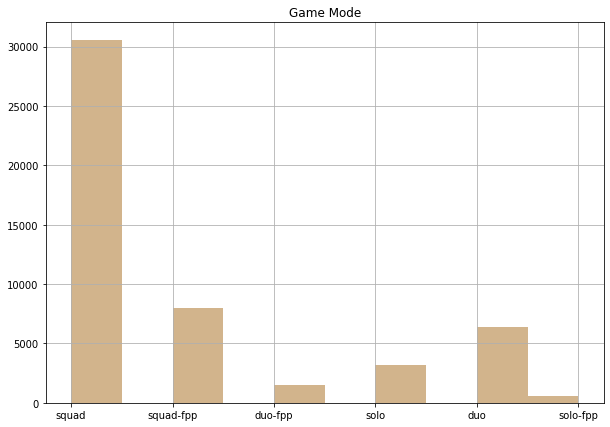

In [441]:
hist1 = kill_data['Game_Mode'].hist(color = 'tan', figsize = (10,7))
hist1.set_title('Game Mode')

__3). Map Name Histogram__

From map name histogram, we can see that `Sanhok` is the most popular map. Followed by `Erangel`, `Miramar` with the least popular map `Vikendi`.

Text(0.5, 1.0, 'Map Name')

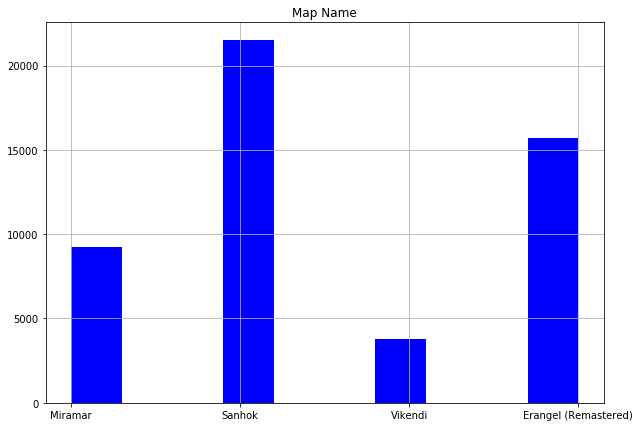

In [442]:
hist2 = kill_data['Map_Name'].hist(color = 'blue', figsize = (10,7))
hist2.set_title('Map Name')

__4). Damage Reason Histogram__

From damage reason histogram, we can see that most injures are `TorsoShot`, followed by `HeadShot`, `PelvisShot`, `LegShot` and `ArmShot`.

Text(0.5, 1.0, 'Damage Reason')

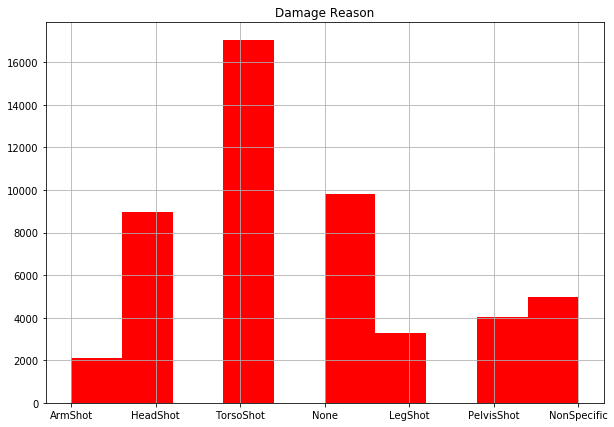

In [443]:
hist3 = kill_data['damage_reason'].hist(color = 'red', figsize = (10,7))
hist3.set_title('Damage Reason')

__5). Weapon Analysis__

From these 2 histogram, we can see which weapons made most kills: 'M416', 'AKM', 'Frag Grenade', 'QBZ95', 'SKS', 'SCAR-L', 'UMP9', 'Kar98k', 'Vector' and 'Beryl' (most frequent to least frequent). Therefore, we know that "M416" is most effective in short distances, and "Kar98k" is more efficient in long distance shooting.

['M416', 'AKM', 'Frag Grenade', 'QBZ95', 'SKS', 'SCAR-L', 'UMP9', 'Kar98k', 'Vector', 'Beryl']


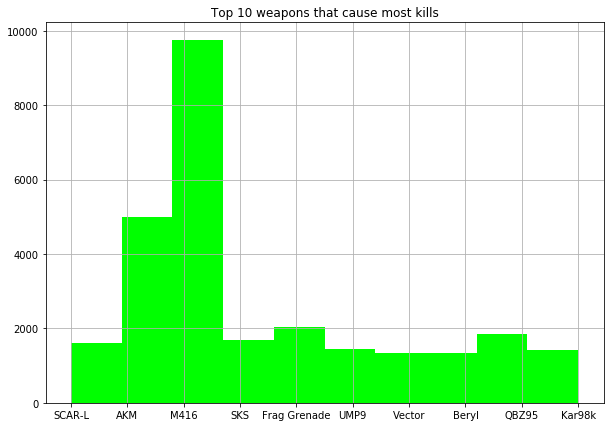

In [444]:
count_damage_causer = Counter(kill_data['damage_causer'])
most_common_causer = count_damage_causer.most_common(12)
list_common_causer = []
for com in most_common_causer:
    reason,count = com
    if reason != 'Player' and reason != 'Bluezone':
        list_common_causer.append(reason)
hist4_data = kill_data[kill_data['damage_causer'].isin(list_common_causer)]
hist4 = hist4_data['damage_causer'].hist(color = 'lime', figsize = (10,7))
hist4.set_title('Top 10 weapons that cause most kills')
print(list_common_causer)

/Users/apple/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


Text(0, 0.5, 'Kill Counts')

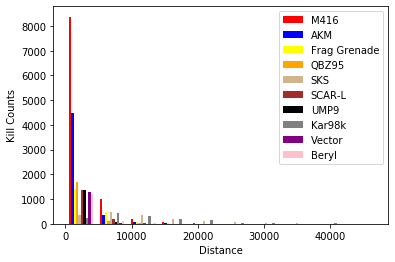

In [445]:
hist4_data['distance'] = ((hist4_data.killer_location_x - hist4_data.victim_location_x)**2 + 
                             (hist4_data.killer_location_y - hist4_data.victim_location_y)**2 +
                            (hist4_data.killer_location_z - hist4_data.victim_location_z)**2) ** (1/2)

distance_std = hist4_data['distance'].std()
no_outlier_hist4 = hist4_data[abs(hist4_data.distance - hist4_data.distance.mean())<distance_std]
import matplotlib.pyplot as plt
color = ['red','blue','yellow','orange','tan','brown','black','grey','purple','pink']
m416 = no_outlier_hist4[no_outlier_hist4.damage_causer == 'M416']
akm = no_outlier_hist4[no_outlier_hist4.damage_causer == 'AKM']
frag = no_outlier_hist4[no_outlier_hist4.damage_causer == 'Frag Grenade']
qbs = no_outlier_hist4[no_outlier_hist4.damage_causer == 'QBZ95']
sks = no_outlier_hist4[no_outlier_hist4.damage_causer == 'SKS']
scarl = no_outlier_hist4[no_outlier_hist4.damage_causer == 'SCAR-L']
ump9 = no_outlier_hist4[no_outlier_hist4.damage_causer == 'UMP9']
kar98 = no_outlier_hist4[no_outlier_hist4.damage_causer == 'Kar98k']
vector = no_outlier_hist4[no_outlier_hist4.damage_causer == 'Vector']
beryl = no_outlier_hist4[no_outlier_hist4.damage_causer == 'Beryl']
legend = ['M416', 'AKM', 'Frag Grenade', 'QBZ95', 'SKS', 'SCAR-L', 'UMP9', 'Kar98k', 'Vector', 'Beryl']
plt.hist([m416.distance,akm.distance,frag.distance,qbs.distance,sks.distance,scarl.distance,
          ump9.distance,kar98.distance,vector.distance,beryl.distance], color = color)
plt.legend(legend)
plt.xlabel("Distance")
plt.ylabel("Kill Counts")

__6). Victim Heatmaps__

We have generated a heatmap in order to see where the players are killed the most. This information can be a reference for winning strategy, since for people who are confident in killing people can go to the places that have the most kills, and people who are not confident in killing people can avoid those regions in order to win the game.

Filter match info according to the maps they belong and get:`erangel`, `miramar`, `sanhok` and `vikendi` dataframes.

In [466]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pyplot import imread

erangel = kill_data.loc[kill_data['Map_Name'] == 'Erangel (Remastered)']
miramar = kill_data.loc[kill_data['Map_Name'] == 'Miramar']
sanhok = kill_data.loc[kill_data['Map_Name'] == 'Sanhok']
vikendi = kill_data.loc[kill_data['Map_Name'] == 'Vikendi']

The original maps are downloaded with PUBG Api, from the official PUBG API github page (https://github.com/ramonsaraiva/pubg-python/blob/master/README.md)

`resizeImg` is helper functions that resize the downloaded maps: 

In [467]:
# identify image size
from PIL import Image

def resizeImg(img_path):
    # resize
    
    im = Image.open(img_path)
    width, height = im.size
    size = 4096, 4096
    im.thumbnail(size)
    # png to jpg
    rgb_im = im.convert('RGB')
    rgb_im.save(img_path[:-4] + ".jpg")

`Get_vict_df` and `get_plot_data` are helper functions that normalizes `erangel`, `miramar`, `sanhok` and `vikendi` to get dataframe to plot:

In [468]:
def get_vict_df(df):
    vict_x = df.filter(regex='victim_location_x')
    vict_y = df.filter(regex='victim_location_y')
    
    vict_x = pd.Series(vict_x.values.ravel())
    vict_y = pd.Series(vict_y.values.ravel())
    
    vdata={'x': vict_x, 
           'y':vict_y }
    
    df = pd.DataFrame(vdata).dropna()

    df = df[df["x"]>0]
    res = df[['x', 'y']].values
    
    return res

In [469]:
def get_plot_data(edf, mdf, sdf, vdf):
    edata = get_vict_df(edf)
    edata = edata*0.0050225
    
    mdata = get_vict_df(mdf)
    mdata = mdata*0.0050225
    
    sdata = get_vict_df(sdf)
    sdata = sdata*0.0101
    
    vdata = get_vict_df(vdf)
    vdata = vdata*0.0066875
    
    return(edata, mdata, sdata, vdata)

`Heatmap` function is taken from this kaggle project(https://www.kaggle.com/skihikingkevin/final-circle-heatmap), we use it as the basic function for generating our victim heatmap:

In [470]:
from scipy.ndimage.filters import gaussian_filter
import matplotlib.cm as cm
from matplotlib.colors import Normalize

def heatmap(x, y, s, bins=100):
    heatmap, xedges, yedges = np.histogram2d(x, y, bins=bins)
    heatmap = gaussian_filter(heatmap, sigma=s)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    return heatmap.T, extent

Our own victim heatmap function:

In [471]:
def display_victim_heatmap(img_path, plot_data): 
    
    # get heatmap data
    lst, ext = heatmap(plot_data[:,0], plot_data[:,1], 2, bins=750)
    
    # set alphas & colors
    lower, upper = lst.max()/100, lst.max()/20
    
    alphas = np.clip(Normalize(0, lower, clip=True)(lst)*1.4, 0.0, 1.)
    colors = cm.coolwarm(Normalize( lower, upper, clip=True)(lst))
    colors[..., -1] = alphas
    
    # set figure size
    fig, ax = plt.subplots(figsize=(20,20))
    
    # set width, height
    im = Image.open(img_path)
    width, height = im.size
    ax.set_xlim(0, width)
    ax.set_ylim(0, height)
    
    # display graph
    ax.imshow(im)
    ax.imshow(colors, extent=ext, origin='lower', alpha=0.75)
    plt.gca().invert_yaxis()

In [472]:
edata, mdata, sdata, vdata = get_plot_data(erangel, miramar, sanhok, vikendi)

Below are the victim heatmaps we generated, for Erangel, Military base as the most kill, for Miranmar pecado has the most kill, for Sanhok, bootcamp has the most kill and for Vikendi, we can see the kills are pretty sparse.

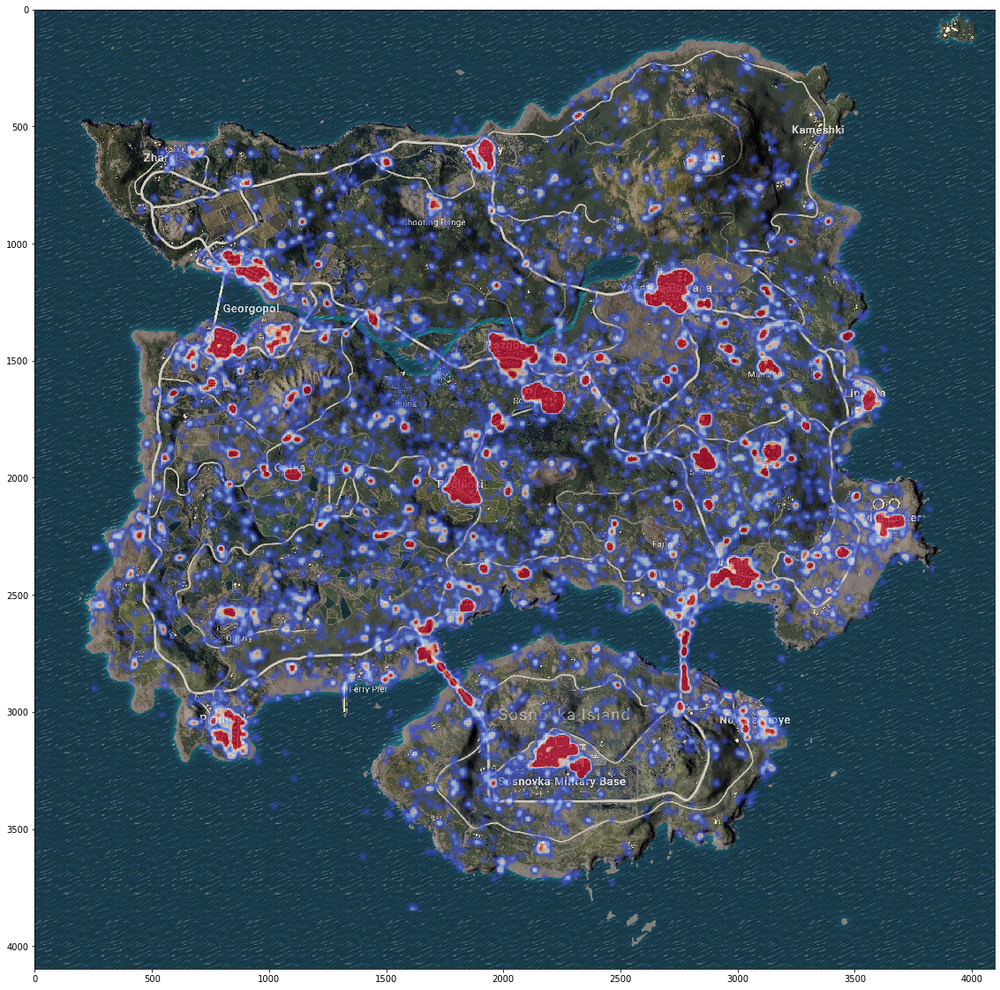

In [453]:
display_victim_heatmap('maps/erangel.jpg', edata)

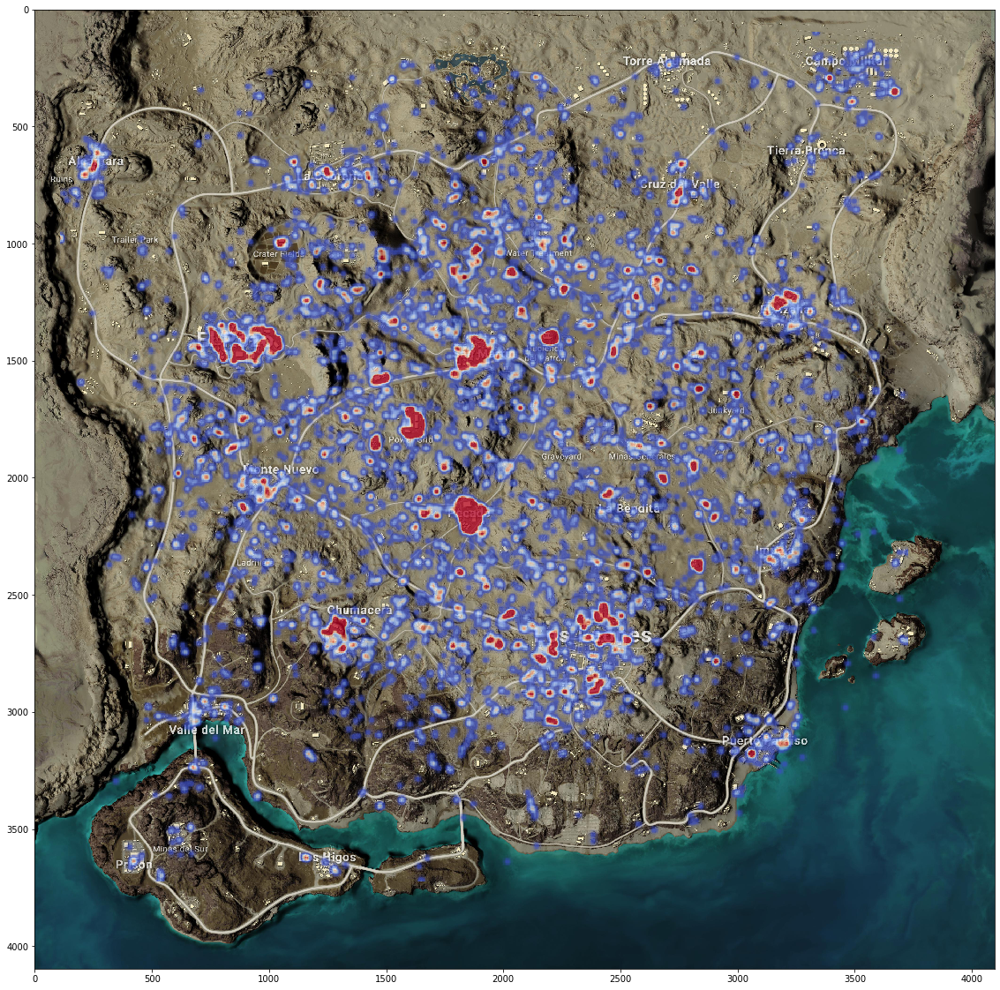

In [454]:
display_victim_heatmap('maps/miramar.jpg', mdata)

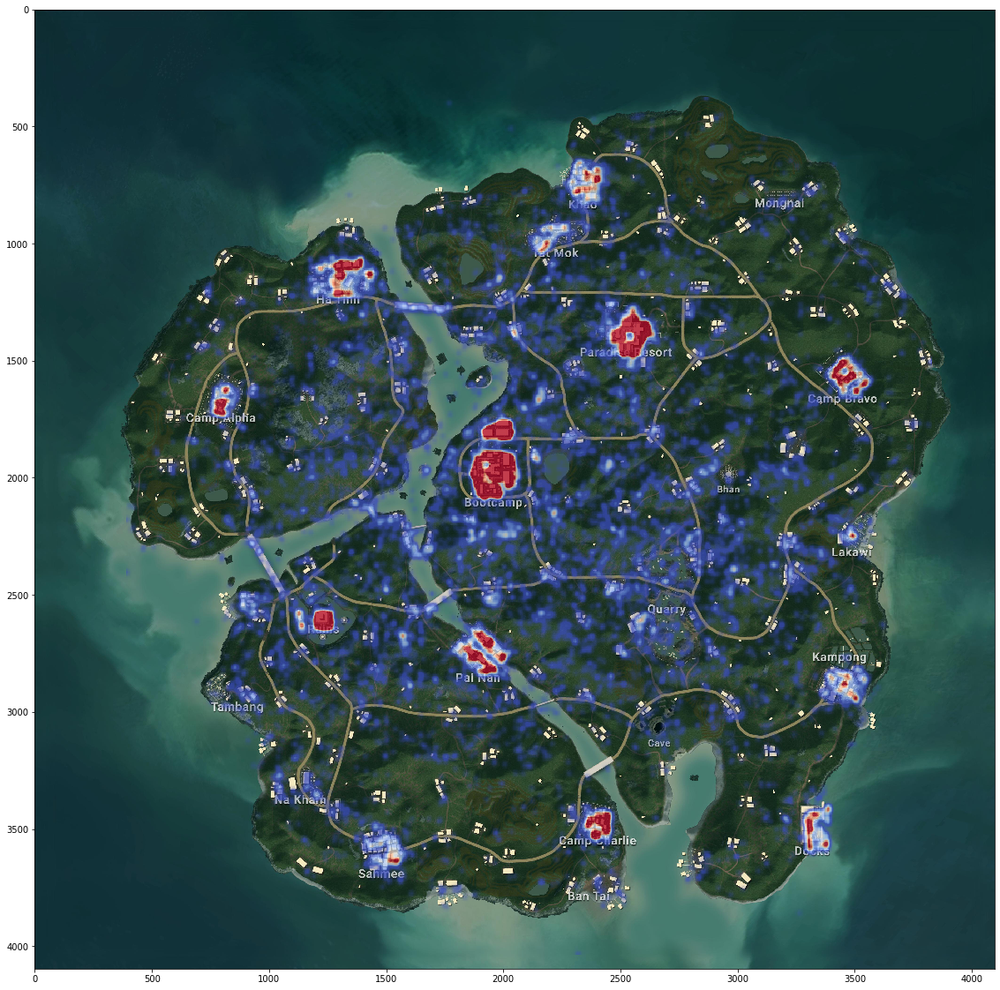

In [455]:
display_victim_heatmap('maps/sanhok.jpg', sdata)

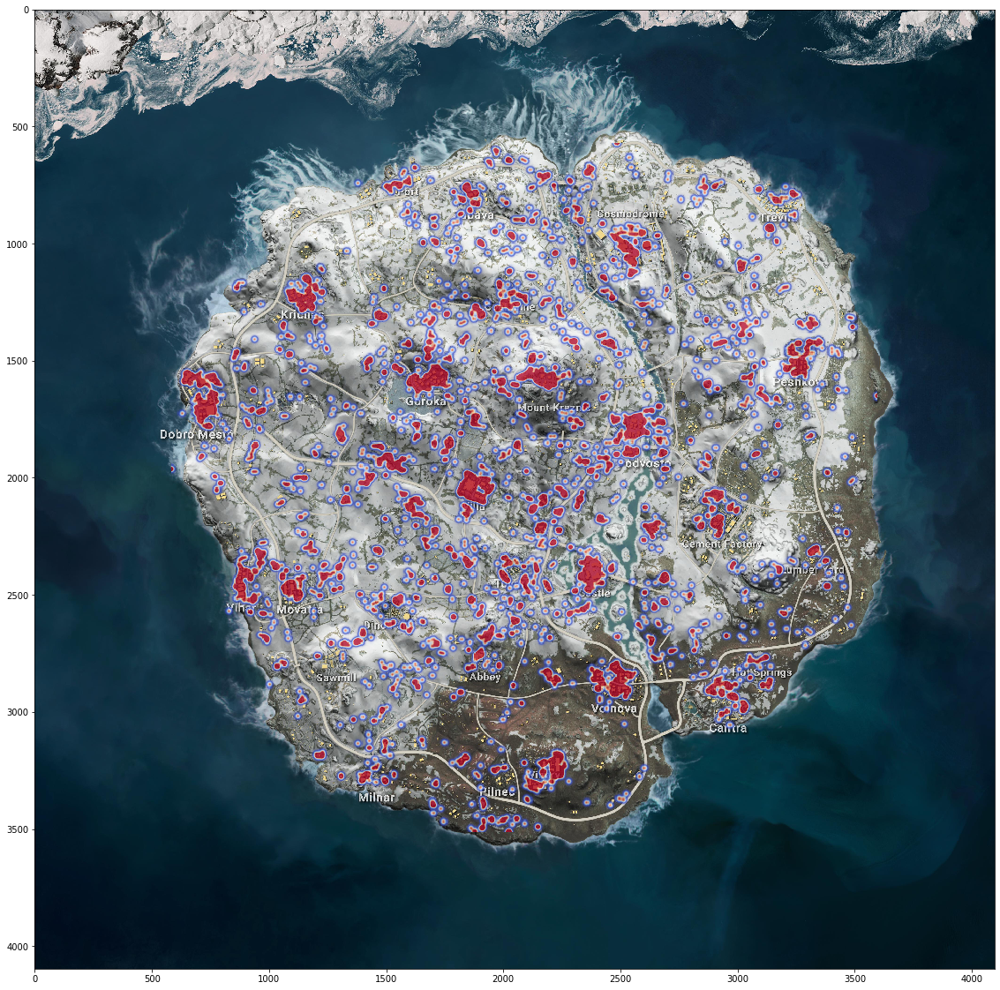

In [456]:
display_victim_heatmap('maps/vikendi.jpg', vdata)

__7). Sample match Animation__

We have generated an animation that shows a match to see the how people played in the game. The total animation is around 1.5 minutes and it shows a fast-forward play of the match. From this process we are able to see where the match started, where people got killed and where the game ended, which shows the general trend of the game. We have attached the


## 5. Logistic Regression

We first run a random forest model to determine the top 5 features that we want to use. Then we use these 5 features and split our data into train and test set. Finally, we perform logistic regression.


__1). Get Initial Features and Label__

We first use all 30 features as our initial input into Random Forest classifier.

In [457]:
from sklearn.model_selection import train_test_split
# Get Labels
labels = data['win_or_not']
# Non-Destructively Remove the Features
tmp = data.drop(columns = ['win_place'], axis = 1)
# Non-Destructively Remove the Labels
features = tmp.drop('win_or_not', axis = 1)
# Save Feature Names
feature_list = list(features.columns)

__2). Random Forest for Feature Selection__

We used `sklearn` library to generate random forest classifier(https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html):

In [458]:
# Import the model we are using
from sklearn.ensemble import RandomForestRegressor
# Instantiate model with 10 decision trees
rf = RandomForestRegressor(n_estimators = 10, max_depth = 3, random_state = 42)
# Train the model on training data
rf.fit(train_features, train_labels)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=3,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10,
                      n_jobs=None, oob_score=False, random_state=42, verbose=0,
                      warm_start=False)

Now, we take one tree out from our Random Forest classifier and try to display it:

In [459]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot
# Pull one tree from the forest
tree = rf.estimators_[5]
# Export the image to a dot file
export_graphviz(tree, out_file = 'tree.dot', 
                feature_names = feature_list, rounded = True, precision = 1)
# Use dot file to create a graph
(graph,) = pydot.graph_from_dot_file('tree.dot')
# Write graph to a png file
graph.write_png('tree.png')

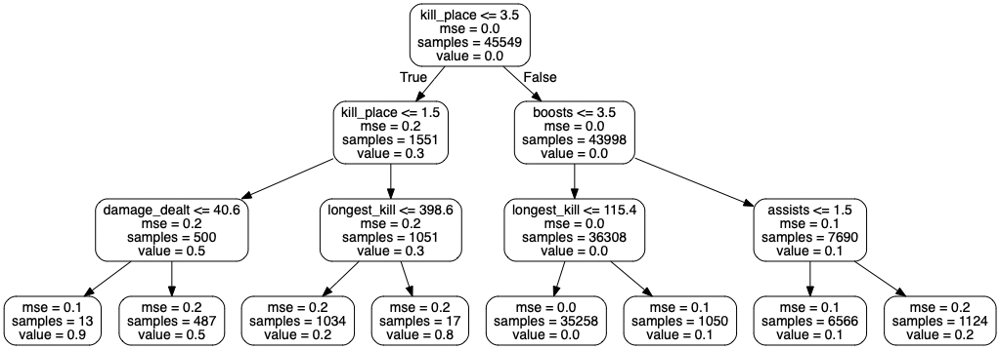

In [460]:
from IPython.display import Image
Image(filename='./tree.png')

Now, we display feature by their importance, we can see that `kill_place`, `boosts`, `assits`, `heals` and `longest_kill` are the top 5 important features:

In [461]:
# Get numerical feature importances
importances = list(rf.feature_importances_)
# List of tuples with variable and importance
feature_importances = [(feature, round(importance, 2)) for feature, importance in zip(feature_list, importances)]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
# Print out the feature and importances 
[print('Variable: {:20} Importance: {}'.format(*pair)) for pair in feature_importances];

Variable: kill_place           Importance: 0.67
Variable: boosts               Importance: 0.19
Variable: assists              Importance: 0.12
Variable: heals                Importance: 0.01
Variable: longest_kill         Importance: 0.01
Variable: dbnos                Importance: 0.0
Variable: damage_dealt         Importance: 0.0
Variable: headshot_kills       Importance: 0.0
Variable: kill_streaks         Importance: 0.0
Variable: kills                Importance: 0.0
Variable: revives              Importance: 0.0
Variable: ride_distance        Importance: 0.0
Variable: road_kills           Importance: 0.0
Variable: swim_distance        Importance: 0.0
Variable: team_kills           Importance: 0.0
Variable: vehicle_destroys     Importance: 0.0
Variable: weapons_acquired     Importance: 0.0
Variable: avg_walk_distance    Importance: 0.0
Variable: map_name_Camp Jackal Importance: 0.0
Variable: map_name_Erangel (Remastered) Importance: 0.0
Variable: map_name_Miramar     Importance: 0.0

__2). Get Top 5 Features and Split Train Test Dataset__

We removed other features from our feature list, and displayed our current feature names:

In [462]:
# Remove the labels from the features
labels = data['win_or_not']

data = data.drop(columns = ['dbnos', 'headshot_kills', 
       'kill_streaks', 'kills','revives', 'damage_dealt',
       'avg_walk_distance', 'ride_distance', 'road_kills', 
        'swim_distance', 'team_kills',
        'vehicle_destroys','map_name_Miramar', 'map_name_Sanhok',
       'weapons_acquired', 'win_place','map_name_Camp Jackal',
       'map_name_Erangel (Remastered)', 
       'map_name_Vikendi', 'game_mode_duo', 'game_mode_duo-fpp',
       'game_mode_solo', 'game_mode_solo-fpp', 'game_mode_squad',
       'game_mode_squad-fpp'], axis = 1)


features = data.drop('win_or_not', axis = 1)

# Saving feature names for later use
feature_list = list(features.columns)
feature_list

['assists', 'boosts', 'heals', 'kill_place', 'longest_kill']

__3). Logistic Regression__

We split our train test dataset, with `sklearn` package (https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html):

In [463]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(features, labels, test_size=0.25, random_state=0)

We used logistic regression model from `sklearn` (https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html).
After we performed logistic regression, we can see that our accuracy is high: 96.59% accuracy.

In [464]:
from sklearn.linear_model import LogisticRegression
logisticRegr = LogisticRegression()
logisticRegr.fit(x_train, y_train)
predictions = logisticRegr.predict(x_test)
score = logisticRegr.score(x_test, y_test)
print(score)

/Users/apple/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


0.96591744361484


Finally we examine our coefficients for 5 features, we can see that except for `heals` and `longest_kill` they are all positive. 

Therefore `boosts`, `kill_place`, `assits` all have positive relationships between them and winning.

In [465]:
logisticRegr.coef_

array([[ 0.50347964,  0.21315055, -0.04844843, -0.05230818,  0.00163609]])

## 6. Conclusions

__1). Response to Research Question__

From weapon analysis in EDA part, we learned that `M416` is most effective in short distances, and `Kar98k` have higher kills in long distance shooting.

From our random forest and logistic regression, we learned that `kill_place`, `boosts`, `assits`, `heals` and `longest_kill` are the top 5 important features that determines whether a player can win a game or not. And using them to predict, we get 96% accuracy.

From this result, we can infer that the more active a player is (they make more assists, boosts and have higher killing rank in game), the more likely he/she can win the game, since coefficients of `killing_place`, `assists`, `boosts` are all significant and positive in our model.

From heatmaps, we know that or Erangel, Military base as the most kill, so we can try to avoid it when playing, similarly for Miranmar avoid going to pecado, for Sanhok, avoid going to bootcamp.

__2). Future Research__

In the future, we can try to create more self-defined features that contribute to different PUBG gaming strategies. Overall, it's a complicated game and very factors(including teammates' performance) contribute to winning.